# Fooling FabMap with HSJA

## 1) Pre-Requisites 

### 1.1) Importing Libraries 

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf


import sys
!{sys.executable} -m pip install git+https://github.com/nottombrown/imagenet_stubs
sys.path.append("..")

%matplotlib inline

tf.compat.v1.disable_eager_execution()

import imagenet_stubs
import numpy as np
import tensorflow.keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
import tensorflow.keras.backend as k
from matplotlib import pyplot as plt
from IPython.display import clear_output, Image, display
import cv2

from art.estimators.classification import KerasClassifier
from art.attacks.evasion import HopSkipJump
from art.utils import to_categorical

from PIL import Image
import matplotlib.image as mpimg

import shutil
import os
import subprocess

  Cloning https://github.com/nottombrown/imagenet_stubs to /tmp/pip-req-build-a1loam61
  Running command git clone --filter=blob:none -q https://github.com/nottombrown/imagenet_stubs /tmp/pip-req-build-a1loam61
  Resolved https://github.com/nottombrown/imagenet_stubs to commit 0b501276f54cbf45b8e1b67dccbdcbe51de88365
  Preparing metadata (setup.py) ... done


/home/romi/anaconda3/envs/mhashir/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/romi/anaconda3/envs/mhashir/lib/python3.6/site-packages/art/estimators/certification/__init__.py:28: UserWarning: PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality
  warnings.warn("PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality")


### 1.2) Setting Up Feature Matchers 

In [3]:
def sift_feature_matching(img1_path, img2_path, threshold=0.7, ransac_threshold=3.0):
    # Load the images
    img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect and compute keypoints and descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    # Initialize a brute-force matcher
    bf = cv2.BFMatcher()

    # Match descriptors
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)

    # Convert keypoints to points
    src_pts = [keypoints1[m.queryIdx].pt for m in good_matches]
    dst_pts = [keypoints2[m.trainIdx].pt for m in good_matches]

    # Perform RANSAC for robustness
    if len(src_pts) >= 4:
        src_pts = np.float32(src_pts).reshape(-1, 1, 2)
        dst_pts = np.float32(dst_pts).reshape(-1, 1, 2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)
        mask_matches = mask.ravel().tolist()
        num_matches = sum(mask_matches)
    else:
        num_matches = 0
        
    return num_matches

In [4]:
def match(img1_path, img2_path, threshold=0.7, ransac_threshold=3.0):
    # Load the images
    img1 = cv2.cvtColor(img1_path[0].astype(np.uint8), cv2.COLOR_RGB2GRAY)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect and compute keypoints and descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    # Initialize a brute-force matcher
    bf = cv2.BFMatcher()

    # Match descriptors
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)

    # Convert keypoints to points
    src_pts = [keypoints1[m.queryIdx].pt for m in good_matches]
    dst_pts = [keypoints2[m.trainIdx].pt for m in good_matches]

    # Perform RANSAC for robustness
    if len(src_pts) >= 4:
        src_pts = np.float32(src_pts).reshape(-1, 1, 2)
        dst_pts = np.float32(dst_pts).reshape(-1, 1, 2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)
        mask_matches = mask.ravel().tolist()
        num_matches = sum(mask_matches)
    else:
        num_matches = 0
        
    print("No. of Features Matched: ", num_matches)
        
    return num_matches

### 1.3) Setting Up Classifier 

In [5]:
mean_imagenet = np.zeros([224, 224, 3])
mean_imagenet[...,0].fill(103.939)
mean_imagenet[...,1].fill(116.779)
mean_imagenet[...,2].fill(123.68)
model = ResNet50(weights='imagenet')
classifier = KerasClassifier(clip_values=(0, 255), model=model, preprocessing=(mean_imagenet, np.ones([224, 224, 3])))

### 1.4) Function For Moving Images From One Directory To Another 

In [6]:
def move_images(img1, img2):
    shutil.copy(img1, "/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images")
    shutil.copy(img2, "/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images")

In [7]:
def move_image(img1):
    shutil.copy(img1, "/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images")

### 1.5) Function For Deleting An Image From A Directory 

In [8]:
def delete_image(img):
    os.remove(img)

### 1.6) Function For Calling FabMap Commands 

In [9]:
def run_fabmap():
    
    directory = '/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/bin'
    command1 = './WordMaker WordMaker_BatchConfig.moos'
    command2 = './FabMap FabMap_BatchConfig.moos'
    try:
        # Change to the desired directory
        os.chdir(directory)

        # Run the first command
        result1 = subprocess.run(command1, shell=True, check=True, universal_newlines=True)
        
        # Run the second command
        result2 = subprocess.run(command2, shell=True, check=True, universal_newlines=True)
        
    except subprocess.CalledProcessError as e:
        print(f"An error occurred while running the command: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")

### 1.7) Function For Reading The Match Score 

In [10]:
def read_score(num):
    path = "/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results"
    name = "Scenes_OxfordVocab_Surf_11k_psame.tmd"
    
    final_path = path+"/"+str(num)+"/"+name
    
    with open(final_path, 'r') as file:
        lines = file.readlines()
        second_line = lines[1]
        first_word = second_line.split()[0]
        
        return first_word

### 1.8) Function For Deleting Everything From A Directory 

In [11]:
def delete_files(directory):
    try:
        # Check if the directory exists
        if not os.path.exists(directory):
            return "Directory does not exist."

        # Iterate over all files and directories in the specified directory
        for filename in os.listdir(directory):
            file_path = os.path.join(directory, filename)

            # If it's a file, delete it
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
            # If it's a directory, delete it and all its contents
            elif os.path.isdir(file_path):
                shutil.rmtree(file_path)

        return "All files and folders have been deleted."

    except Exception as e:
        return f"An error occurred: {e}"

## 2) Attacks 

### 2.1) Attack 1 

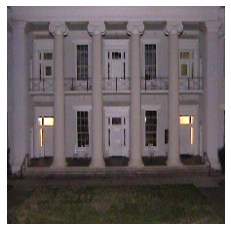

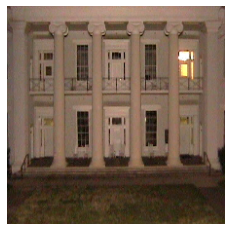

**********Output File**********

1 
0.956731 0.0432692 

**********Match Score**********

0.956731


In [16]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/i_kions/4.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/i_kions/5.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/1/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(1))

In [18]:
delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/5.ppm')

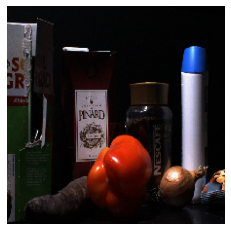

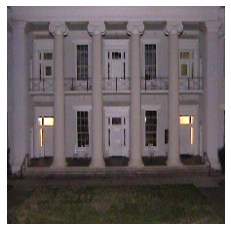

**********Output File**********

1 
0.000558036 0.999442 

**********Match Score**********

0.000558036


In [19]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/i_pinard/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/i_kions/4.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/2/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(2))

In [26]:
delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/1.ppm')
delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/4.ppm')

move_image('/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/i_kions/5.ppm')

initial_prediction:  perfume


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1256.16it/s]

Adversarial image at step 0. L2 error 34342.71 and class label 711.
I think this is a:  perfume


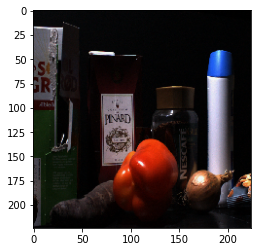

HopSkipJump: 100%|██████████| 1/1 [00:15<00:00, 15.55s/it]

Adversarial image at step 10. L2 error 23132.506 and class label 711.
I think this is a:  perfume


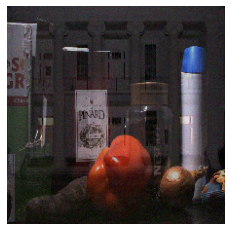

HopSkipJump: 100%|██████████| 1/1 [00:20<00:00, 20.71s/it]

Adversarial image at step 20. L2 error 19649.771 and class label 711.
I think this is a:  perfume


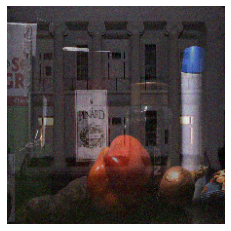

HopSkipJump: 100%|██████████| 1/1 [00:24<00:00, 24.50s/it]

Adversarial image at step 30. L2 error 16498.38 and class label 711.
I think this is a:  perfume


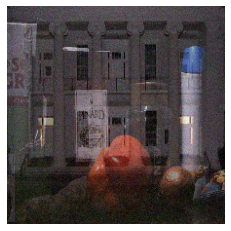

HopSkipJump: 100%|██████████| 1/1 [00:27<00:00, 27.93s/it]

Adversarial image at step 40. L2 error 14112.22 and class label 711.
I think this is a:  perfume


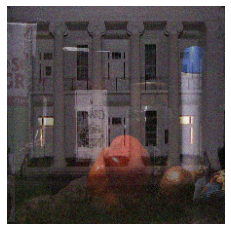

HopSkipJump: 100%|██████████| 1/1 [00:30<00:00, 30.76s/it]

Adversarial image at step 50. L2 error 12017.693 and class label 711.
I think this is a:  perfume


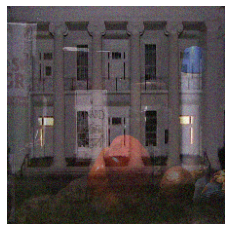

HopSkipJump: 100%|██████████| 1/1 [00:32<00:00, 32.78s/it]

Adversarial image at step 60. L2 error 10524.894 and class label 711.
I think this is a:  perfume


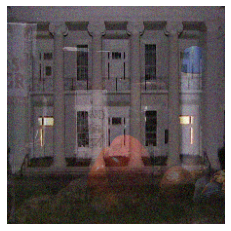

HopSkipJump: 100%|██████████| 1/1 [00:34<00:00, 34.91s/it]

Adversarial image at step 70. L2 error 9280.633 and class label 711.
I think this is a:  perfume


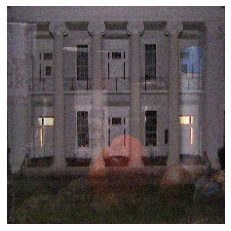

HopSkipJump: 100%|██████████| 1/1 [00:36<00:00, 36.66s/it]

Adversarial image at step 80. L2 error 8261.937 and class label 711.
I think this is a:  perfume


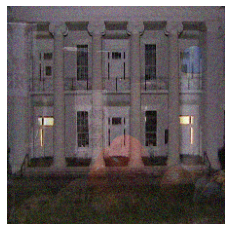

HopSkipJump: 100%|██████████| 1/1 [00:39<00:00, 39.87s/it]

Adversarial image at step 90. L2 error 6554.5483 and class label 711.
I think this is a:  perfume


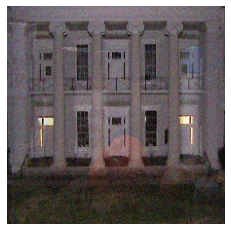

HopSkipJump: 100%|██████████| 1/1 [00:40<00:00, 40.45s/it]

Adversarial image at step 100. L2 error 5504.4897 and class label 711.
I think this is a:  perfume


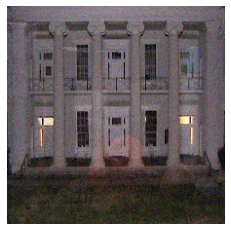

**********Match Score**********

0.000558036


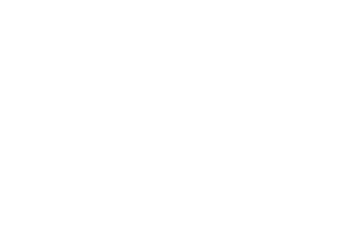

In [35]:
num = 3

with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0
    
    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)
        
        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)
        plt.axis('off')

        attack.max_iter = iter_step
        
#         print(match(x_adv, init_image_path))
        
#         if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_cartooncity/3.ppm") <=4 and i>=10):
#             break
        if(i>=10):
            cv2.imwrite('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg', x_adv[0])
            run_fabmap()
            # Reading the score
            print("*"*10+"Match Score"+"*"*10+"\n")
            print(read_score(num))
            delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg')
            if(float(read_score(num))<=float(read_score(1))*0.2):
                break
            num+=1
            
        
        i+=1

In [38]:
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results')
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images')

'All files and folders have been deleted.'

### Attack 2 

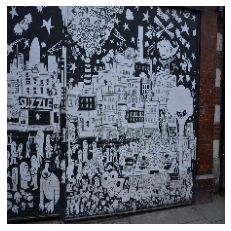

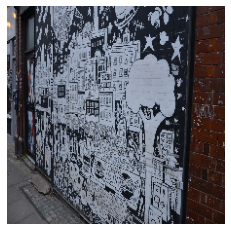

**********Output File**********

1 
0.956731 0.0432692 

**********Match Score**********

0.956731


In [44]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_cartooncity/2.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_cartooncity/3.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/1/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(1))

In [45]:
delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/3.ppm')

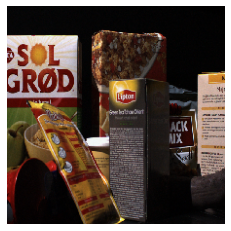

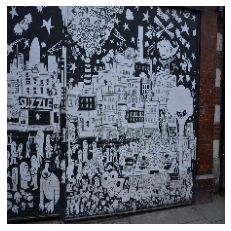

**********Output File**********

1 
0.000558036 0.999442 

**********Match Score**********

0.000558036


In [46]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/i_greentea/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_cartooncity/2.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/2/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(2))

In [47]:
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images')

'All files and folders have been deleted.'

In [49]:
move_image('/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_cartooncity/3.ppm')

initial_prediction:  hair_spray


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1190.21it/s]

Adversarial image at step 0. L2 error 37533.254 and class label 585.
I think this is a:  hair_spray


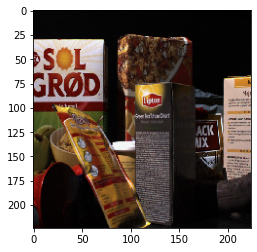

HopSkipJump: 100%|██████████| 1/1 [00:15<00:00, 15.68s/it]

Adversarial image at step 10. L2 error 30686.455 and class label 585.
I think this is a:  hair_spray


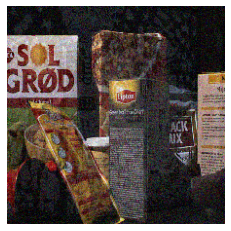

HopSkipJump: 100%|██████████| 1/1 [00:21<00:00, 21.23s/it]

Adversarial image at step 20. L2 error 23098.688 and class label 585.
I think this is a:  hair_spray


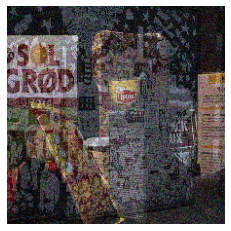

HopSkipJump: 100%|██████████| 1/1 [00:25<00:00, 25.64s/it]

Adversarial image at step 30. L2 error 19983.588 and class label 585.
I think this is a:  hair_spray


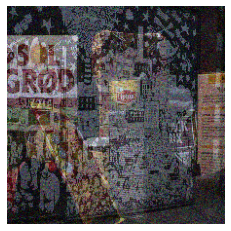

HopSkipJump: 100%|██████████| 1/1 [00:28<00:00, 28.39s/it]

Adversarial image at step 40. L2 error 18148.678 and class label 585.
I think this is a:  hair_spray


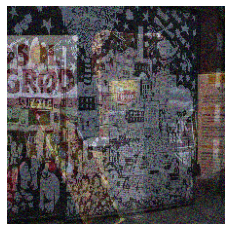

HopSkipJump: 100%|██████████| 1/1 [00:31<00:00, 31.34s/it]

Adversarial image at step 50. L2 error 15525.938 and class label 585.
I think this is a:  hair_spray


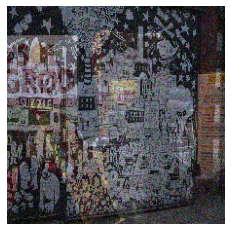

HopSkipJump: 100%|██████████| 1/1 [00:34<00:00, 34.20s/it]

Adversarial image at step 60. L2 error 14246.339 and class label 585.
I think this is a:  hair_spray


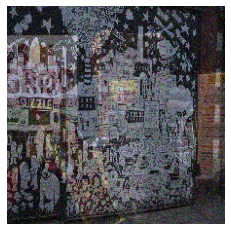

HopSkipJump: 100%|██████████| 1/1 [00:35<00:00, 35.76s/it]

Adversarial image at step 70. L2 error 12747.756 and class label 585.
I think this is a:  hair_spray


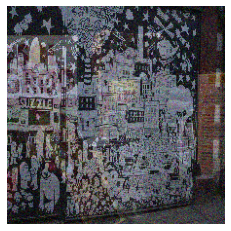

HopSkipJump: 100%|██████████| 1/1 [00:37<00:00, 37.73s/it]

Adversarial image at step 80. L2 error 11183.488 and class label 585.
I think this is a:  hair_spray


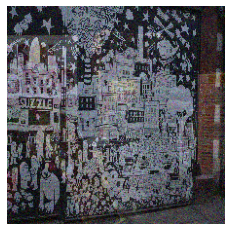

HopSkipJump: 100%|██████████| 1/1 [00:39<00:00, 39.75s/it]

Adversarial image at step 90. L2 error 9774.875 and class label 585.
I think this is a:  hair_spray


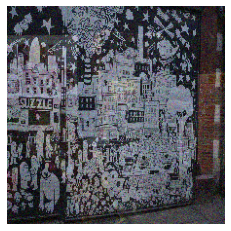

HopSkipJump: 100%|██████████| 1/1 [00:41<00:00, 41.76s/it]

Adversarial image at step 100. L2 error 7203.1216 and class label 585.
I think this is a:  hair_spray


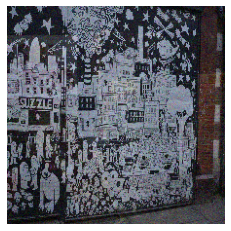

**********Match Score**********

0.000558036


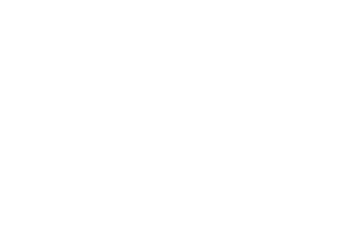

In [50]:
num = 3

with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0
    
    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)
        
        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)
        plt.axis('off')

        attack.max_iter = iter_step
        
#         print(match(x_adv, init_image_path))
        
#         if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_cartooncity/3.ppm") <=4 and i>=10):
#             break
        if(i>=10):
            cv2.imwrite('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg', x_adv[0])
            run_fabmap()
            # Reading the score
            print("*"*10+"Match Score"+"*"*10+"\n")
            print(read_score(num))
            delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg')
            if(float(read_score(num))<=float(read_score(1))*0.2):
                break
            num+=1
            
        
        i+=1

In [51]:
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results')
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images')

'All files and folders have been deleted.'

### 2.3) Attack 3 

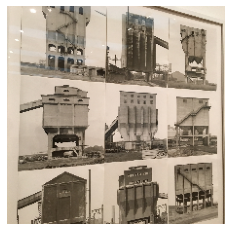

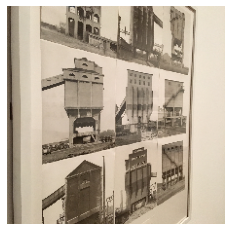

**********Output File**********

1 
0.956731 0.0432692 

**********Match Score**********

0.956731


In [20]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_machines/2.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_machines/3.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/1/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(1))

In [21]:
delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/3.ppm')

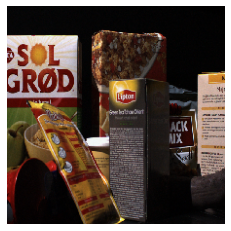

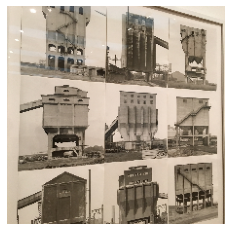

**********Output File**********

1 
0.000558036 0.999442 

**********Match Score**********

0.000558036


In [22]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/i_greentea/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_machines/2.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/2/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(2))

In [23]:
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images')

'All files and folders have been deleted.'

In [24]:
move_image('/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_machines/3.ppm')

initial_prediction:  hair_spray


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1349.08it/s]

Adversarial image at step 0. L2 error 49627.516 and class label 585.
I think this is a:  hair_spray


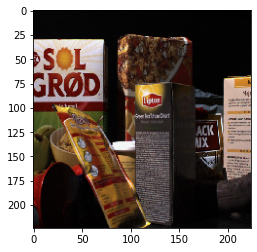

HopSkipJump: 100%|██████████| 1/1 [00:15<00:00, 15.16s/it]

Adversarial image at step 10. L2 error 38175.562 and class label 585.
I think this is a:  hair_spray


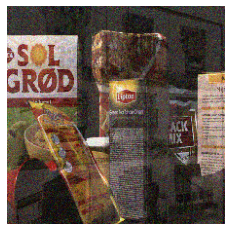

HopSkipJump: 100%|██████████| 1/1 [00:20<00:00, 20.40s/it]

Adversarial image at step 20. L2 error 34324.895 and class label 585.
I think this is a:  hair_spray


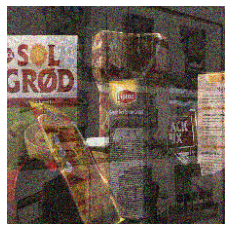

HopSkipJump: 100%|██████████| 1/1 [00:24<00:00, 24.07s/it]

Adversarial image at step 30. L2 error 29340.88 and class label 585.
I think this is a:  hair_spray


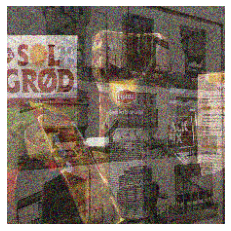

HopSkipJump: 100%|██████████| 1/1 [00:27<00:00, 27.28s/it]

Adversarial image at step 40. L2 error 25537.732 and class label 585.
I think this is a:  hair_spray


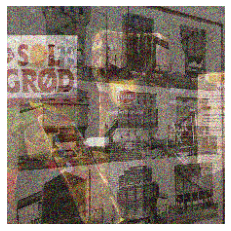

HopSkipJump: 100%|██████████| 1/1 [00:29<00:00, 29.90s/it]

Adversarial image at step 50. L2 error 22315.166 and class label 585.
I think this is a:  hair_spray


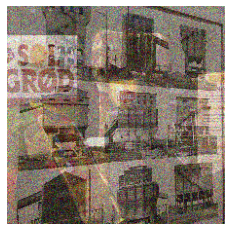

HopSkipJump: 100%|██████████| 1/1 [00:31<00:00, 31.94s/it]

Adversarial image at step 60. L2 error 20607.732 and class label 585.
I think this is a:  hair_spray


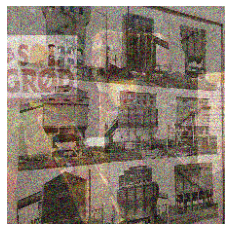

HopSkipJump: 100%|██████████| 1/1 [00:34<00:00, 34.16s/it]

Adversarial image at step 70. L2 error 19104.23 and class label 585.
I think this is a:  hair_spray


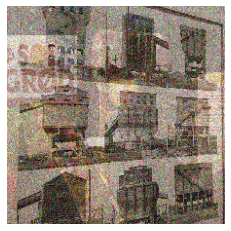

HopSkipJump: 100%|██████████| 1/1 [00:36<00:00, 36.25s/it]

Adversarial image at step 80. L2 error 16714.436 and class label 585.
I think this is a:  hair_spray


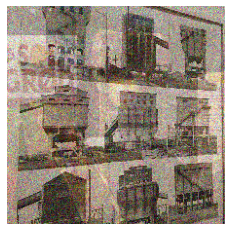

HopSkipJump: 100%|██████████| 1/1 [00:38<00:00, 38.08s/it]

Adversarial image at step 90. L2 error 15211.029 and class label 585.
I think this is a:  hair_spray


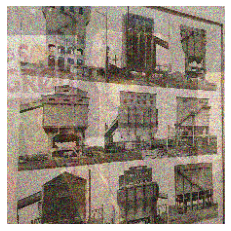

HopSkipJump: 100%|██████████| 1/1 [00:39<00:00, 39.71s/it]

Adversarial image at step 100. L2 error 13353.25 and class label 585.
I think this is a:  hair_spray


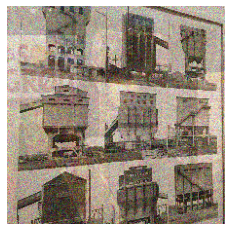

HopSkipJump: 100%|██████████| 1/1 [00:41<00:00, 41.80s/it]

Adversarial image at step 110. L2 error 11711.01 and class label 585.
I think this is a:  hair_spray


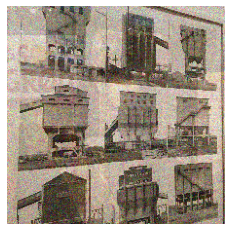

HopSkipJump: 100%|██████████| 1/1 [00:43<00:00, 43.39s/it]

Adversarial image at step 120. L2 error 10501.6875 and class label 585.
I think this is a:  hair_spray


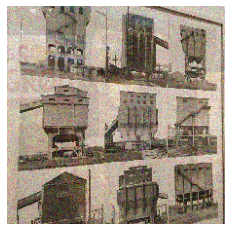

HopSkipJump: 100%|██████████| 1/1 [00:45<00:00, 45.23s/it]

Adversarial image at step 130. L2 error 9428.932 and class label 585.
I think this is a:  hair_spray


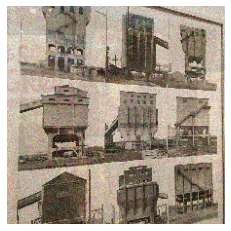

HopSkipJump: 100%|██████████| 1/1 [00:46<00:00, 46.49s/it]

Adversarial image at step 140. L2 error 8548.637 and class label 585.
I think this is a:  hair_spray


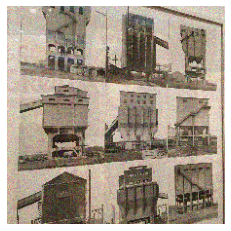

HopSkipJump: 100%|██████████| 1/1 [00:48<00:00, 48.14s/it]

Adversarial image at step 150. L2 error 7921.3086 and class label 585.
I think this is a:  hair_spray


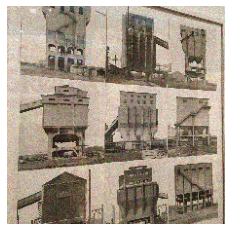

**********Match Score**********

0.000558036


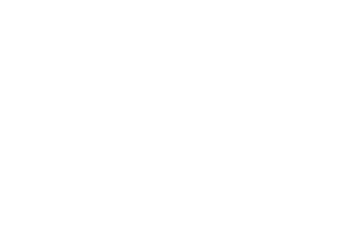

In [25]:
num = 3

with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0
    
    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)
        
        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)
        plt.axis('off')

        attack.max_iter = iter_step
        
#         print(match(x_adv, init_image_path))
        
#         if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_cartooncity/3.ppm") <=4 and i>=10):
#             break
        if(i>=15):
            cv2.imwrite('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg', x_adv[0])
            run_fabmap()
            # Reading the score
            print("*"*10+"Match Score"+"*"*10+"\n")
            print(read_score(num))
            delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg')
            if(float(read_score(num))<=float(read_score(1))*0.2):
                break
            num+=1
            
        
        i+=1

In [34]:
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results')
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images')

'All files and folders have been deleted.'

### 2.4) Attack 4 

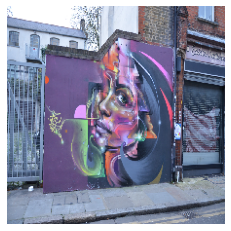

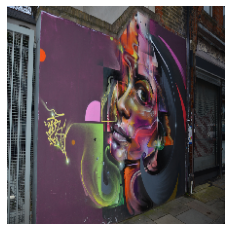

**********Output File**********

1 
0.956731 0.0432692 

**********Match Score**********

0.956731


In [35]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_woman/2.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_woman/3.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/1/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(1))

In [36]:
delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/3.ppm')

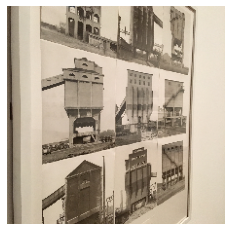

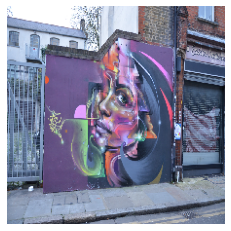

**********Output File**********

1 
0.000558036 0.999442 

**********Match Score**********

0.000558036


In [37]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_machines/3.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_woman/2.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/2/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(2))

In [38]:
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images')

'All files and folders have been deleted.'

In [39]:
move_image('/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_woman/3.ppm')

initial_prediction:  refrigerator


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1077.67it/s]

Adversarial image at step 0. L2 error 34279.387 and class label 760.
I think this is a:  refrigerator


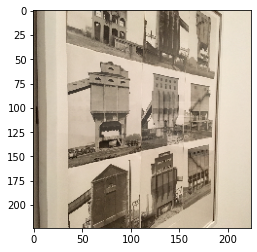

HopSkipJump: 100%|██████████| 1/1 [00:14<00:00, 14.88s/it]

Adversarial image at step 10. L2 error 24326.209 and class label 760.
I think this is a:  refrigerator


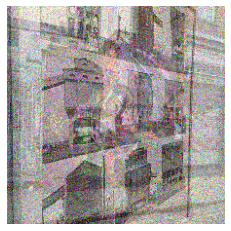

HopSkipJump: 100%|██████████| 1/1 [00:20<00:00, 20.31s/it]

Adversarial image at step 20. L2 error 20688.365 and class label 760.
I think this is a:  refrigerator


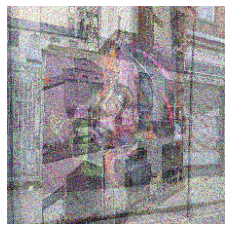

HopSkipJump: 100%|██████████| 1/1 [00:23<00:00, 23.53s/it]

Adversarial image at step 30. L2 error 16803.688 and class label 760.
I think this is a:  refrigerator


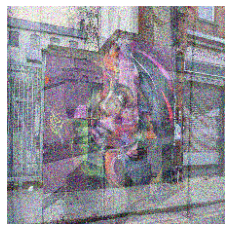

HopSkipJump: 100%|██████████| 1/1 [00:26<00:00, 26.56s/it]

Adversarial image at step 40. L2 error 12388.908 and class label 760.
I think this is a:  refrigerator


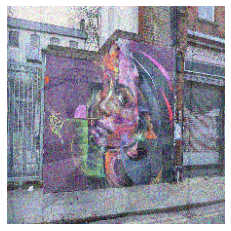

HopSkipJump: 100%|██████████| 1/1 [00:29<00:00, 29.23s/it]

Adversarial image at step 50. L2 error 9568.441 and class label 760.
I think this is a:  refrigerator


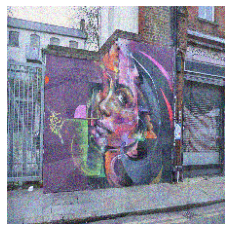

HopSkipJump: 100%|██████████| 1/1 [00:31<00:00, 31.75s/it]

Adversarial image at step 60. L2 error 7689.0283 and class label 760.
I think this is a:  refrigerator


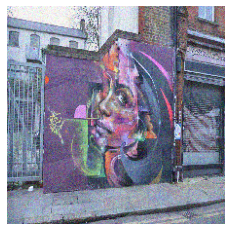

HopSkipJump: 100%|██████████| 1/1 [00:33<00:00, 33.78s/it]

Adversarial image at step 70. L2 error 6213.8774 and class label 760.
I think this is a:  refrigerator


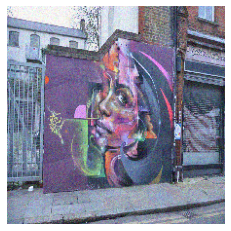

HopSkipJump: 100%|██████████| 1/1 [00:35<00:00, 35.81s/it]

Adversarial image at step 80. L2 error 4930.582 and class label 760.
I think this is a:  refrigerator


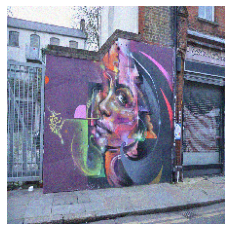

HopSkipJump: 100%|██████████| 1/1 [00:37<00:00, 37.79s/it]

Adversarial image at step 90. L2 error 3821.0007 and class label 760.
I think this is a:  refrigerator


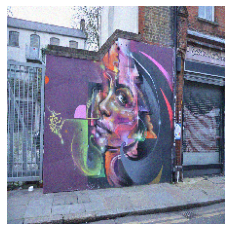

HopSkipJump: 100%|██████████| 1/1 [00:39<00:00, 39.61s/it]

Adversarial image at step 100. L2 error 3116.4663 and class label 760.
I think this is a:  refrigerator


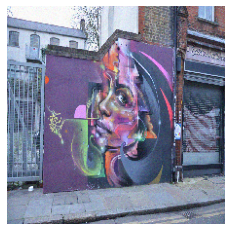

HopSkipJump: 100%|██████████| 1/1 [00:40<00:00, 40.99s/it]

Adversarial image at step 110. L2 error 2516.678 and class label 760.
I think this is a:  refrigerator


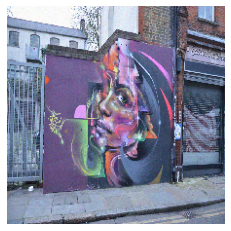

HopSkipJump: 100%|██████████| 1/1 [00:43<00:00, 43.25s/it]

Adversarial image at step 120. L2 error 2167.017 and class label 760.
I think this is a:  refrigerator


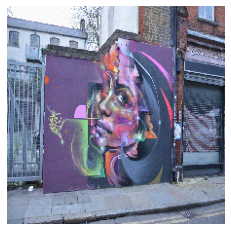

HopSkipJump: 100%|██████████| 1/1 [00:44<00:00, 44.76s/it]

Adversarial image at step 130. L2 error 1879.1289 and class label 760.
I think this is a:  refrigerator


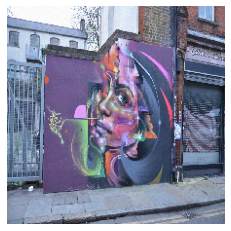

HopSkipJump: 100%|██████████| 1/1 [00:46<00:00, 46.30s/it]

Adversarial image at step 140. L2 error 1686.8289 and class label 760.
I think this is a:  refrigerator


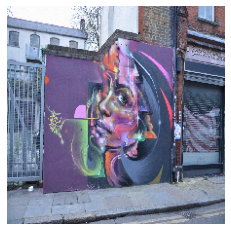

HopSkipJump: 100%|██████████| 1/1 [00:47<00:00, 47.77s/it]

Adversarial image at step 150. L2 error 1491.7689 and class label 760.
I think this is a:  refrigerator


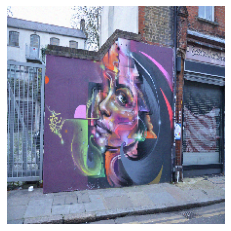

**********Match Score**********

0.000558036


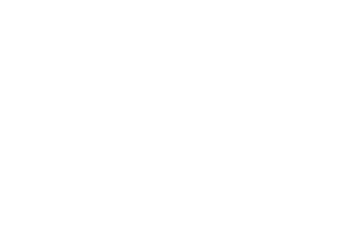

In [40]:
num = 3

with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0
    
    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)
        
        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)
        plt.axis('off')

        attack.max_iter = iter_step
        
#         print(match(x_adv, init_image_path))
        
#         if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_cartooncity/3.ppm") <=4 and i>=10):
#             break
        if(i>=15):
            cv2.imwrite('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg', x_adv[0])
            run_fabmap()
            # Reading the score
            print("*"*10+"Match Score"+"*"*10+"\n")
            print(read_score(num))
            delete_image('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images/image.jpg')
            if(float(read_score(num))<=float(read_score(1))*0.2):
                break
            num+=1
            
        
        i+=1

In [41]:
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results')
delete_files('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Resources/Sample_Data/Images')

'All files and folders have been deleted.'

## Special Case

### Case 1 

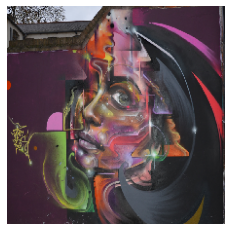

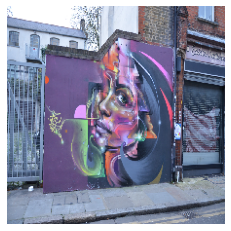

**********Output File**********

1 
0.000558036 0.999442 

**********Match Score**********

0.000558036


In [27]:
# Loading first image
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_woman/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()

# Loading second image
target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hpatches-sequences-release/v_woman/2.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

# Moving images to FabMap resource directory
move_images(init_image_path, target_image_name)

# Running FabMap to get results
run_fabmap()

# Displaying the output
print("*"*10+"Output File"+"*"*10+"\n")
f = open('/home/romi/Desktop/Muhammad_Hashir/hsja_fabmap/FabMap_Linux/Results/1/Scenes_OxfordVocab_Surf_11k_psame.tmd', 'r')
file_contents = f.read()
print (file_contents)
f.close()

# Reading the score
print("*"*10+"Match Score"+"*"*10+"\n")
print(read_score(1))